In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
sns.set(font="Times New Roman")

import matplotlib.pyplot as plt
import matplotlib_inline
import matplotlib
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
matplotlib.rcParams['font.family'] = 'Times New Roman'
# plt.rcParams.update({'font.size': 12})

import sys
sys.path.append("../MyMLLibrary/")

import helper as h
import DataTransformation as dt

In [2]:
df_train = pd.read_csv('train.csv')
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [5]:
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

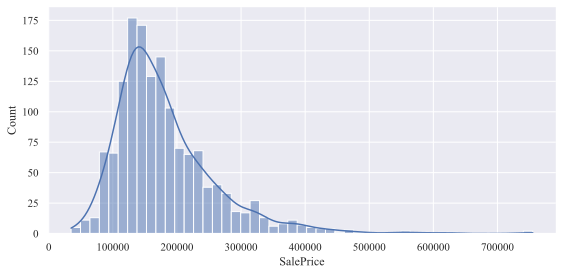

In [7]:
displot = sns.displot(df_train['SalePrice'], kind='hist', kde=True, height=4, aspect=2)


In [8]:
print("Skewness: %f" % df_train['SalePrice'].skew())
print("Kurtosis: %f" % df_train['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


In [9]:
df_train.drop(['Id'], axis=1, inplace=True)
df_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


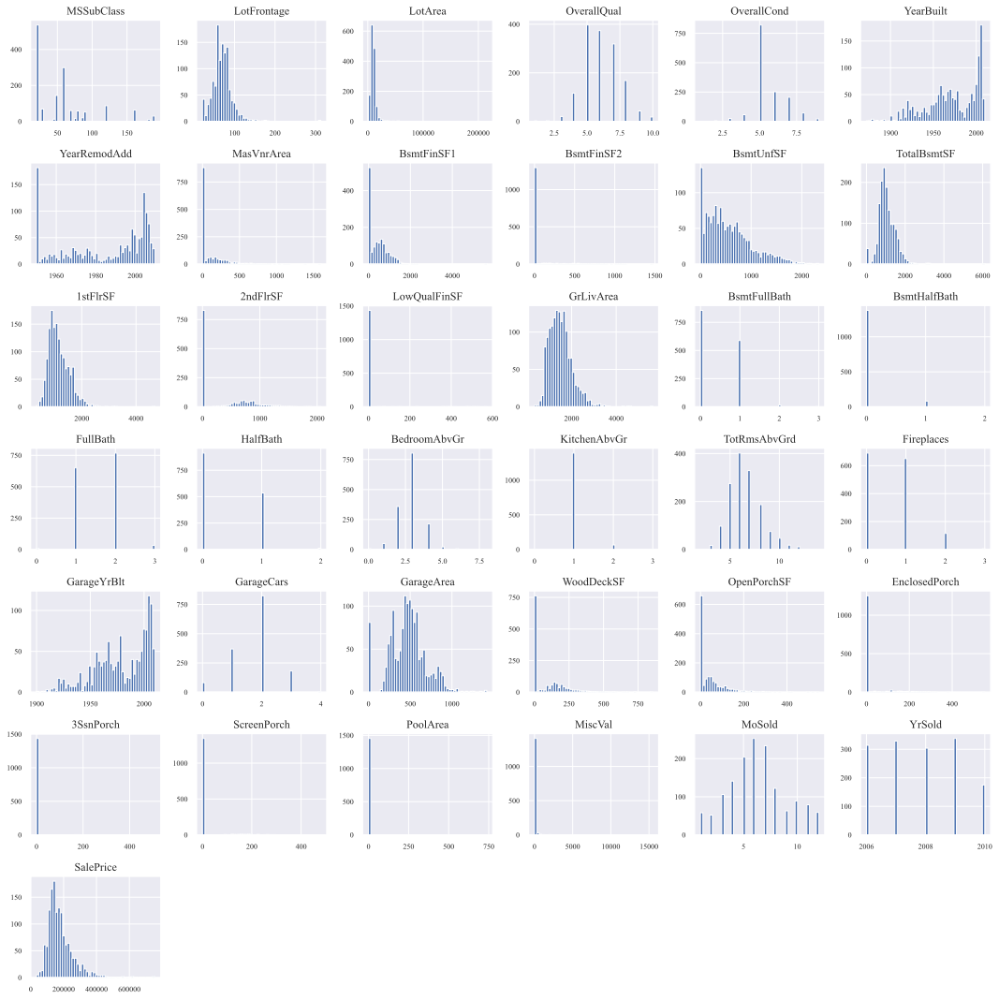

In [10]:
df_train.hist(figsize=(15,15), bins=50, xlabelsize=8, ylabelsize=8)
plt.tight_layout()

In [11]:
df_train['SalePrice'].min(), df_train['SalePrice'].max()

(34900, 755000)

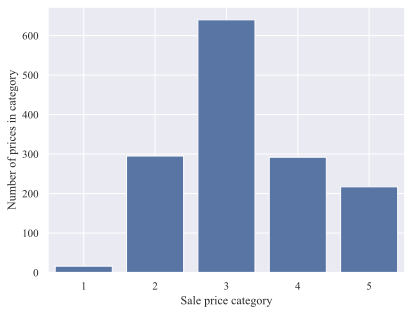

In [12]:
df_train['SalePriceCategory'] = pd.cut(df_train['SalePrice'], 
                                       bins=np.concatenate((np.linspace(0, 250000, 5), np.array([np.inf]))),
                                       labels=[1,2,3,4,5])


sns.countplot(data=df_train, x='SalePriceCategory')
plt.xlabel("Sale price category")
plt.ylabel("Number of prices in category")
plt.grid(True)
plt.show()


# df_train['SalePriceCategory'].value_counts().sort_index().plot.bar(grid=True)
# plt.xlabel("Sale price category")
# plt.ylabel("Number of prices in category")
# plt.show()

In [13]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(df_train, 
                                       test_size=0.2, 
                                       random_state=42)

strat_train_set, strat_test_set = train_test_split(df_train, 
                                                    test_size=0.2, 
                                                    stratify=df_train['SalePriceCategory'], 
                                                    random_state=42)

In [14]:
compared_proportions = h.compare_proportions(df_train, strat_train_set, train_set, 'SalePriceCategory')
(compared_proportions * 100).round(2)

,Overall %,Stratified %,Random %,Strat. Error %,Rand. Error %
SalePriceCategory,,,,,
1,1.10,1.11,1.03,1.56,-6.25
2,20.21,20.21,19.61,0.00,-2.97
3,43.84,43.84,44.01,0.00,0.39
4,20.00,20.03,20.89,0.17,4.45
5,14.86,14.81,14.47,-0.35,-2.65


In [15]:
for set_ in (strat_train_set, train_set, strat_test_set, test_set, df_train):
    set_.drop("SalePriceCategory", axis=1, inplace=True)

In [16]:
train_data = strat_train_set.copy()

In [17]:
correlation_matrix = train_data.corr(numeric_only=True)
correlation_matrix['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789086
GrLivArea        0.700128
GarageCars       0.647362
GarageArea       0.628865
TotalBsmtSF      0.597085
1stFlrSF         0.593872
FullBath         0.554628
YearBuilt        0.536939
TotRmsAbvGrd     0.531756
YearRemodAdd     0.509656
GarageYrBlt      0.492882
MasVnrArea       0.470957
Fireplaces       0.462348
BsmtFinSF1       0.382069
LotFrontage      0.353031
WoodDeckSF       0.323432
OpenPorchSF      0.319280
2ndFlrSF         0.318937
HalfBath         0.285372
LotArea          0.253763
BsmtFullBath     0.235202
BsmtUnfSF        0.193308
BedroomAbvGr     0.157452
ScreenPorch      0.114415
PoolArea         0.105188
MoSold           0.058728
3SsnPorch        0.051622
BsmtFinSF2       0.012548
BsmtHalfBath    -0.020978
MiscVal         -0.024223
YrSold          -0.043722
LowQualFinSF    -0.057967
MSSubClass      -0.073479
OverallCond     -0.098386
EnclosedPorch   -0.121067
KitchenAbvGr    -0.138890
Name: SalePrice, dtype: float64

In [18]:
from pandas.plotting import scatter_matrix
attributes = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']

scatter_matrix(train_data[attributes], figsize=(15, 15))
plt.tight_layout()
plt.show()

In [19]:
houses = train_data.drop("SalePrice", axis=1)
houses_labels = train_data["SalePrice"].copy()


In [20]:
from sklearn.impute import SimpleImputer

houses_num = houses.select_dtypes(include=[np.number])
imputer = SimpleImputer(strategy="median")
imputer.fit(houses_num)


SimpleImputer(strategy='median')

In [21]:
imputer.statistics_

array([5.0000e+01, 6.9000e+01, 9.4230e+03, 6.0000e+00, 5.0000e+00,
       1.9730e+03, 1.9940e+03, 0.0000e+00, 3.6950e+02, 0.0000e+00,
       4.8450e+02, 9.9000e+02, 1.0800e+03, 0.0000e+00, 0.0000e+00,
       1.4705e+03, 0.0000e+00, 0.0000e+00, 2.0000e+00, 0.0000e+00,
       3.0000e+00, 1.0000e+00, 6.0000e+00, 1.0000e+00, 1.9790e+03,
       2.0000e+00, 4.7800e+02, 0.0000e+00, 2.4500e+01, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 6.0000e+00,
       2.0080e+03])

In [22]:
X = imputer.transform(houses_num)
houses_imputer = pd.DataFrame(X, columns=houses_num.columns, index=houses_num.index)
houses_imputer.head()


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
1133,60.0,80.0,9828.0,8.0,5.0,1995.0,1995.0,0.0,584.0,0.0,...,466.0,0.0,155.0,0.0,0.0,0.0,0.0,0.0,6.0,2009.0
256,60.0,64.0,8791.0,6.0,5.0,2003.0,2003.0,0.0,503.0,0.0,...,673.0,216.0,56.0,0.0,0.0,0.0,0.0,0.0,5.0,2008.0
826,45.0,50.0,6130.0,5.0,6.0,1924.0,1950.0,0.0,784.0,0.0,...,0.0,0.0,0.0,116.0,0.0,0.0,0.0,0.0,5.0,2008.0
472,180.0,35.0,3675.0,6.0,5.0,2005.0,2005.0,80.0,459.0,0.0,...,525.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0
1245,80.0,78.0,12090.0,6.0,7.0,1984.0,2003.0,74.0,0.0,0.0,...,477.0,268.0,112.0,0.0,0.0,147.0,0.0,0.0,1.0,2007.0


In [23]:
houses_cat = houses.select_dtypes(include=[np.object_])
imputer_cat = SimpleImputer(strategy="constant", fill_value="MISSING")
imputer_cat.fit(houses_cat)


SimpleImputer(fill_value='MISSING', strategy='constant')

In [24]:
X = imputer_cat.transform(houses_cat)
houses_cat_imputer = pd.DataFrame(X, columns=houses_cat.columns, index=houses_cat.index)
houses_cat_imputer.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
1133,RL,Pave,MISSING,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,...,Attchd,RFn,TA,TA,Y,MISSING,MISSING,MISSING,WD,Normal
256,FV,Pave,MISSING,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,...,Attchd,RFn,TA,TA,Y,MISSING,MISSING,MISSING,WD,Normal
826,RM,Pave,MISSING,Reg,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,...,MISSING,MISSING,MISSING,MISSING,Y,MISSING,MISSING,MISSING,WD,Normal
472,RM,Pave,MISSING,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,...,Basment,RFn,TA,TA,Y,MISSING,MISSING,MISSING,WD,Normal
1245,RL,Pave,MISSING,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,...,BuiltIn,Fin,TA,TA,Y,MISSING,MISSING,MISSING,WD,Abnorml


In [25]:
merged_df = pd.concat([houses_cat_imputer, houses_labels], axis=1)
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1168 entries, 1133 to 742
Data columns (total 44 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MSZoning       1168 non-null   object
 1   Street         1168 non-null   object
 2   Alley          1168 non-null   object
 3   LotShape       1168 non-null   object
 4   LandContour    1168 non-null   object
 5   Utilities      1168 non-null   object
 6   LotConfig      1168 non-null   object
 7   LandSlope      1168 non-null   object
 8   Neighborhood   1168 non-null   object
 9   Condition1     1168 non-null   object
 10  Condition2     1168 non-null   object
 11  BldgType       1168 non-null   object
 12  HouseStyle     1168 non-null   object
 13  RoofStyle      1168 non-null   object
 14  RoofMatl       1168 non-null   object
 15  Exterior1st    1168 non-null   object
 16  Exterior2nd    1168 non-null   object
 17  MasVnrType     1168 non-null   object
 18  ExterQual      1168 non-null   

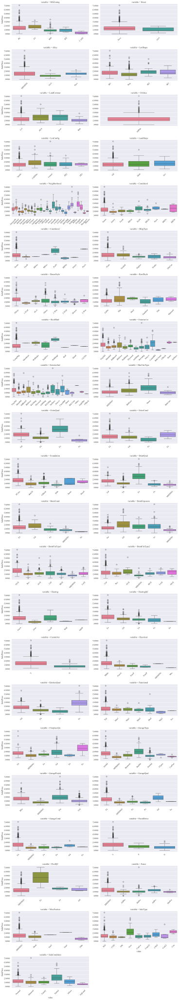

In [55]:
f = pd.melt(merged_df, id_vars=['SalePrice'], value_vars=houses_cat_imputer)
g = sns.FacetGrid(f, col="variable", col_wrap=2, sharex=False, sharey=False, height=3.5, aspect=2)

g.map_dataframe(sns.boxplot, x="value", y="SalePrice", hue="value", palette="husl")

g.set_xticklabels(rotation=45)
g.set(yticks=range(houses_labels.min(), houses_labels.max(), 100000))

plt.tight_layout()
plt.show()